In [1]:
from __future__ import print_function
import cv2
import numpy as np
from matplotlib import pyplot as plt
from os import listdir
from os.path import isfile, join, splitext, isdir
from itertools import chain
import sys
sys.path.insert(0,"/home/chm/Source/Robonet")
from colorSegment import ObjectDetector

In [2]:
colors = ["green", "red", "blue", "yellow", "purple", "orange"]
allowed_image_extentions = [".jpg",".jpeg",".png"]
objects_base = "data/objects"
data_paths = {color:
              [join(objects_base,item) for item in listdir(objects_base) 
                  if isdir(join(objects_base,item)) and color in item.lower()]
                for color in colors}
data_paths

{'blue': ['data/objects/blue_cube'],
 'green': ['data/objects/green_qube'],
 'orange': [],
 'purple': [],
 'red': ['data/objects/red_qube'],
 'yellow': ['data/objects/yellow_sphere', 'data/objects/yellow_cube']}

In [15]:
hsv_ranges = {
    "green":(np.array([40,130,40]),np.array([85,255,200])),
    "blue": (np.array([18,130,15]),np.array([35,255,200])),
    "yellow": (np.array([90,190,80]),np.array([100,255,200])),
    "purple": (np.array([120,50,30]),np.array([180,130,200])),
    "red": (np.array([118,130,40]),np.array([130,255,200])),
    "orange":(np.array([107,150,40]),np.array([115,255,230])),
}

13051.0
range_hue = [18, 35]
range_saturation = [130, 255]


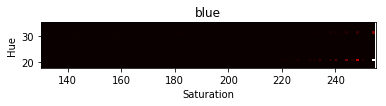

0.0
range_hue = [120, 180]
range_saturation = [50, 130]


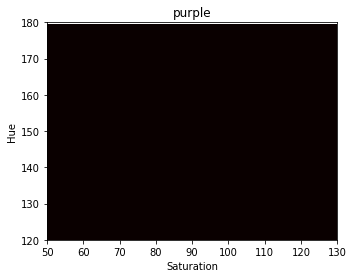

8246.0
range_hue = [90, 100]
range_saturation = [190, 255]


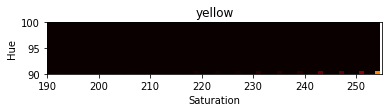

7008.0
range_hue = [40, 85]
range_saturation = [130, 255]


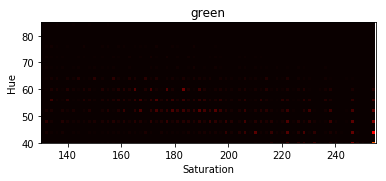

0.0
range_hue = [107, 115]
range_saturation = [150, 255]


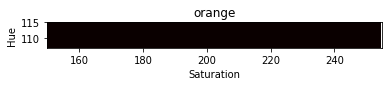

5111.0
range_hue = [118, 130]
range_saturation = [130, 255]


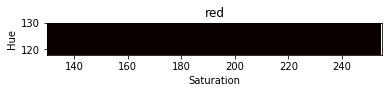

In [16]:
%matplotlib inline





for color,hsv_range in hsv_ranges.items():
    image_files = chain(*[
        [join(data_path, f) 
            for f in listdir(data_path) if splitext(f)[1] in allowed_image_extentions]
                for data_path in data_paths[color]])
    hsvs = np.empty((0,3))
    for img_path in image_files :
        img = cv2.imread(img_path)
        
        #This object is stored as RGB
        hsv = cv2.cvtColor(img,cv2.COLOR_RGB2HSV)
        (width,height,channels) = hsv.shape
        assert(channels == 3)
        n_pix = width*height
        hsvs = np.r_[hsvs,hsv.reshape((n_pix,3))]
        
    
    h = hsvs[:,0]
    s = hsvs[:,1]
    v = hsvs[:,2]
    low_bound, high_bound = hsv_range
    range_hue = [low_bound[0],high_bound[0]]
    range_saturation = [low_bound[1],high_bound[1]]
    hist, xbins, ybins = np.histogram2d(h,s,[180,255],[range_hue,range_saturation],normed=False )
    print(hist.max())
    plt.imshow(hist,interpolation = 'nearest',cmap="hot",aspect="equal")
    plt.xlabel("Saturation")
    plt.ylabel("Hue")
    print("range_hue =",range_hue)
    print("range_saturation =",range_saturation)
    
    plt.title(color)
    plt.xlim(low_bound[1],high_bound[1])
    plt.ylim(low_bound[0],high_bound[0])
    plt.show()

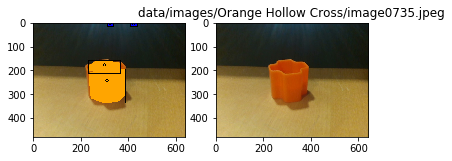

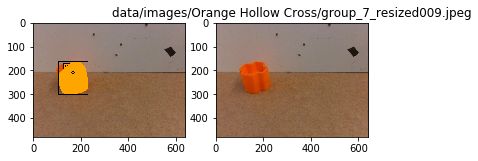

Too many object candidates


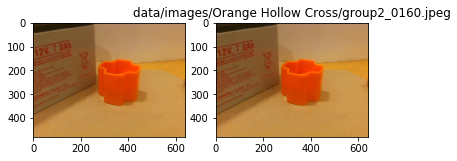

data/images/Orange Hollow Cross/group2_0160.jpeg


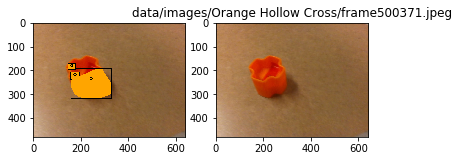

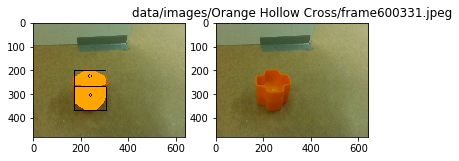

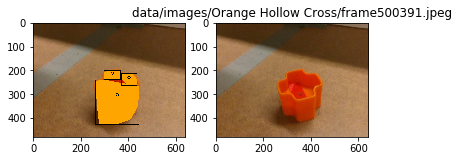

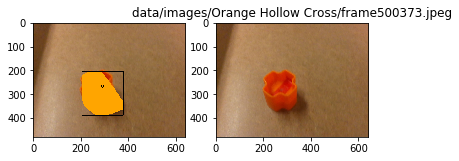

area_too_big = False
width_too_large = False
height_too_large = True


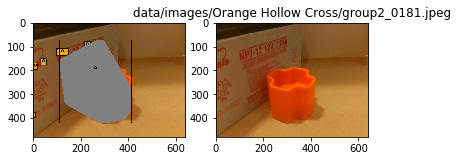

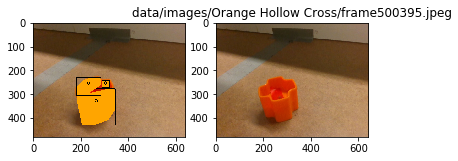

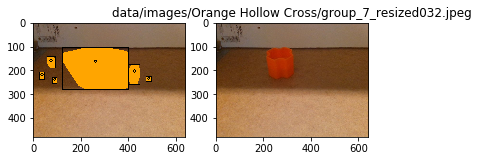

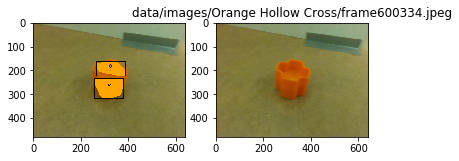

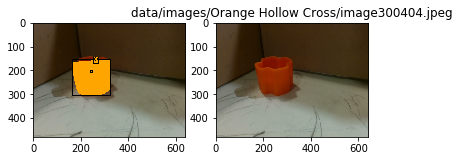

...

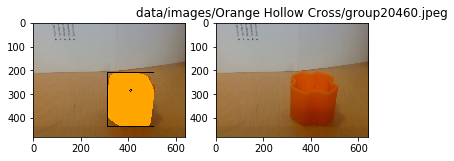

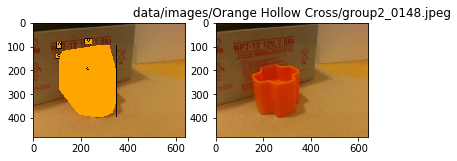

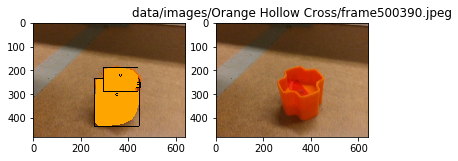

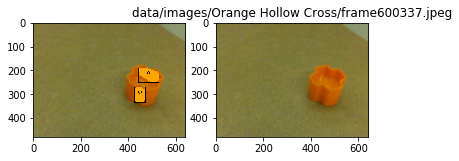

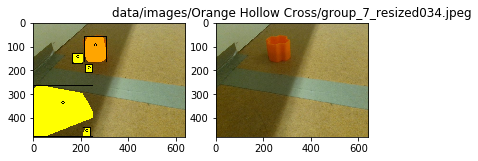

area_too_big = True
width_too_large = False
height_too_large = True


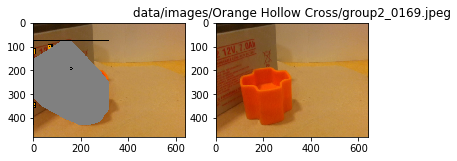

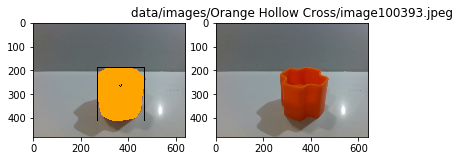

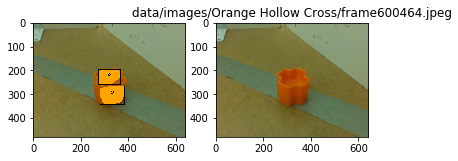

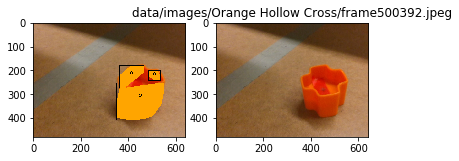

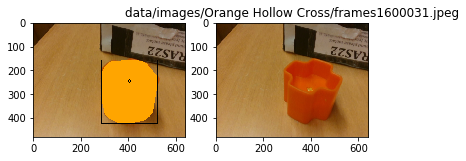

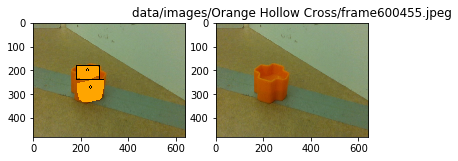

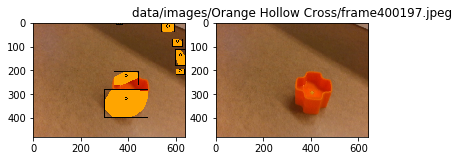

area_too_big = True
width_too_large = False
height_too_large = True


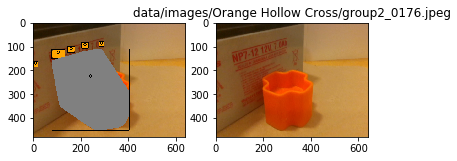

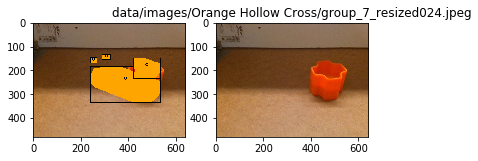

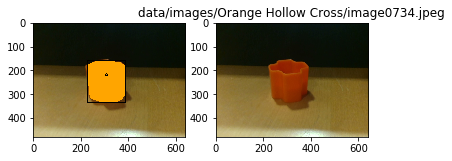

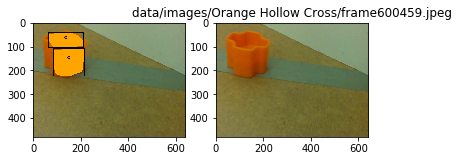

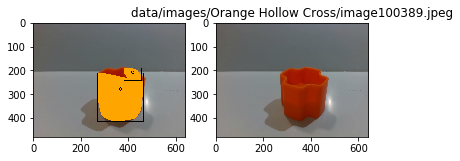

...

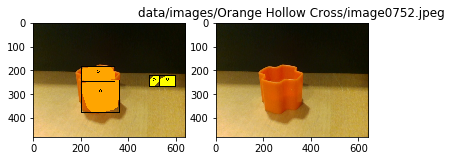

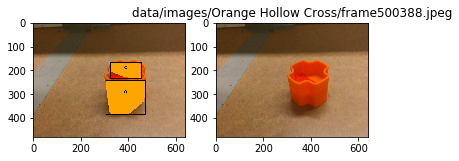

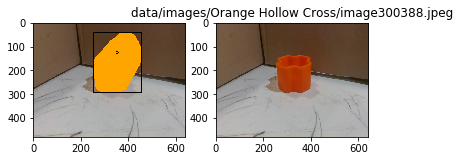

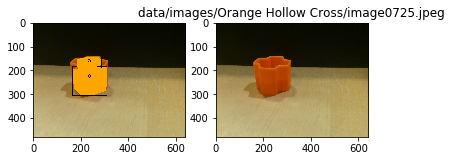

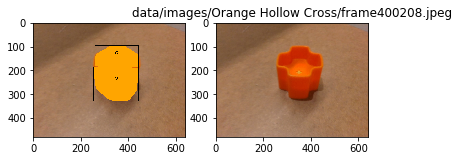

area_too_big = True
width_too_large = True
height_too_large = True


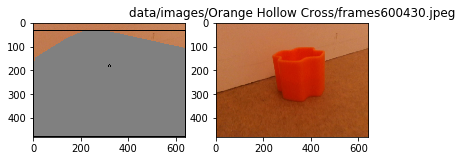

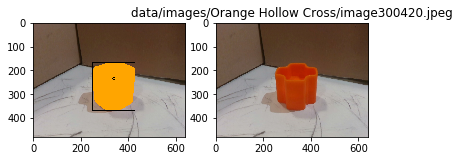

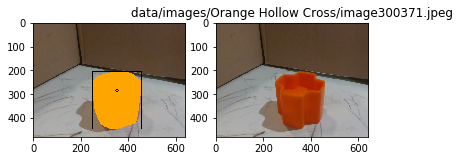

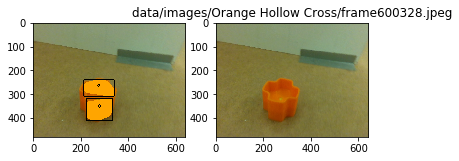

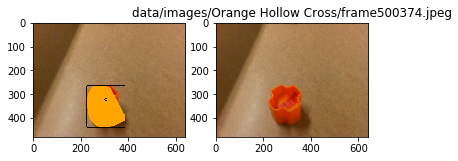

...

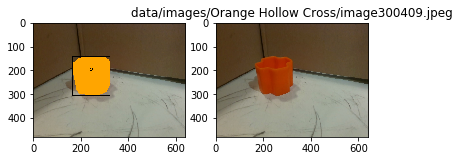

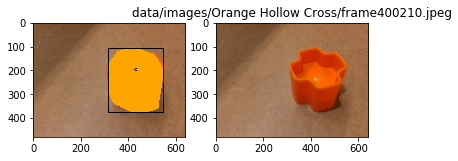

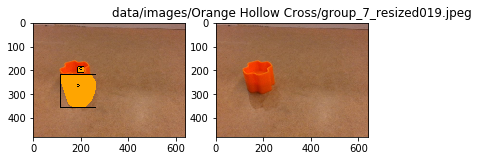

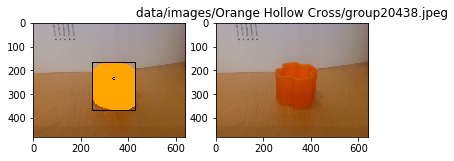

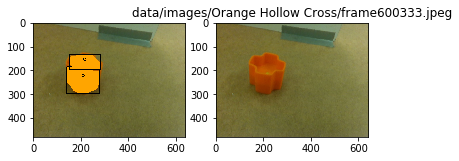

In [17]:
%matplotlib inline


#data_path = "data/images/Purple Hollow Cross"
#data_path = "data/images/Red Hollow Cube"
#data_path = "data/images/Blue Cube"
data_path = "data/images/Orange Hollow Cross"
imageFiles = [join(data_path, f) for 
              f in listdir(data_path) if isfile(join(data_path, f))]
sorted(imageFiles)

detector = ObjectDetector(hsv_ranges)
bad_im_paths = set()
for rgb_image_path in imageFiles:
    rgb_image = cv2.imread(rgb_image_path)
    bgr_image = cv2.cvtColor(rgb_image,cv2.COLOR_RGB2BGR)
    obj_cands,rgb_dbg = detector.color_segment_image(bgr_image,True)
    plt.subplot(121)
    plt.imshow(rgb_dbg)
    plt.subplot(122)
    rgb_image = cv2.cvtColor(rgb_image,cv2.COLOR_RGB2BGR)
    plt.imshow(rgb_image)
    plt.title(rgb_image_path)
    plt.show()
    if len(obj_cands) == 0:
        print(rgb_image_path)
        bad_im_paths.add(rgb_image_path)
        


Plot the open cv hsv color space

In [ ]:
color_space = np.zeros((255,180,3),dtype=np.uint8)
for x in range(255):
    for y in range(180):
        color_space[x,y,1] = x
        color_space[x,y,0] = y
        color_space[x,y,2] = 255
cv_color_space =  cv2.cvtColor(color_space, cv2.COLOR_HSV2BGR)
plt.imshow(cv_color_space)
plt.xlabel("hue")
plt.ylabel("saturation")
plt.title("hue and satureation in open cv")


In [ ]:
ls
